# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

# Load Packages

In [201]:
import hashlib
import os
import pickle
from urllib.request import urlretrieve

import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer, StandardScaler, scale
from sklearn.utils import resample
from skimage import transform as sktf
from tqdm import tqdm
from zipfile import ZipFile
import matplotlib.pyplot as plt
import tensorflow as tf
from scipy import linalg
session = tf.InteractiveSession()

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

%matplotlib inline
print('All modules imported.')

All modules imported.


In [202]:
'''
Adapted from Keras https://github.com/fchollet/keras/blob/master/keras/preprocessing/image.py
'''

class ImageBatchProcessor(object):
    
    def __init__(self, rescale=None):
        
        self.mean = None
        self.stddev = None
        self.zca_whitening = None
        self.rescale = rescale
     
    def normalize_images(self, X, fit_only=True):
    
        R = np.copy(X)
        # calculate mean
        self.mean = np.mean(R, axis=(0, 1, 2))
        broadcast_shape = [1, 1, 1]
        broadcast_shape[3 - 1] = R.shape[3]
        self.mean = np.reshape(self.mean, broadcast_shape)
        self.mean = self.mean.astype(dtype='float64')
        
        # calculate stddev and divide from each image.
        self.stddev = np.std(R, axis=(0, 1, 2))
        broadcast_shape = [1, 1, 1]
        broadcast_shape[3 - 1] = R.shape[3]
        self.stddev = np.reshape(self.stddev, broadcast_shape)
        self.stddev = self.stddev.astype(dtype='float64')
        
        # calculate zca whitening
        flatX = np.reshape(R, (R.shape[0], R.shape[1] * R.shape[2] * R.shape[3]))
        sigma = np.dot(flatX.T, flatX) / flatX.shape[0]
        U, S, V = linalg.svd(sigma)
        self.zca_whitening = np.dot(np.dot(U, np.diag(1. / np.sqrt(S + 10e-7))), U.T)
        
        # apply normalization
        if (not fit_only):
            # rescale
            if (self.rescale is not None):
                R *= self.rescale
                
            R -= self.mean
            R /= (self.stddev + 1e-7)
        
        return R
    
    def normalize_image(self, x):
        
        image = np.copy(x)
        # rescale
        if (self.rescale is not None):
            image *= self.rescale
        
        if self.mean is not None:
            image -= self.mean
        else:
            warnings.warn('You must first run normalize images on the entire data set.')
            
        if self.stddev is not None:
            image /= (self.stddev + 1e-7)
        else:
            warnings.warn('You must first run normalize images on the entire data set.')
 
        return image
        
    def zca_whiten_image(self, x):
        
        image = np.copy(x)
        
        if self.zca_whitening is not None:
            flatx = np.reshape(image, (image.size))
            whitex = np.dot(flatx, self.zca_whitening)
            image = np.reshape(whitex, (image.shape[0], image.shape[1], image.shape[2]))
        
        return image
    def scale_image(self, x):
        image = np.copy(x)
        
        
    

In [203]:
ibp = ImageBatchProcessor()

In [246]:
datagen = ImageDataGenerator(
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        horizontal_flip=False,
        vertical_flip=False,
        fill_mode='nearest')




In [278]:
# The German Traffic Sign Recognition Benchmark
#
# sample code for reading the traffic sign images and the
# corresponding labels
#
# example:
#            
# trainImages, trainLabels = readTrafficSigns('GTSRB/Training')
# print len(trainLabels), len(trainImages)
# plt.imshow(trainImages[42])
# plt.show()
#
# have fun, Christian

import csv

# function for reading the images
# arguments: path to the traffic sign data, for example './GTSRB/Training'
# returns: list of images, list of corresponding labels 
def readTrafficSigns(rootpath, n):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.

    Arguments: path to the traffic sign data, for example './GTSRB/Training'
    Returns:   list of images, list of corresponding labels'''
    images = [] # images
    labels = [] # corresponding labels
    coords = []
    
    # loop over all 42 classes
    for c in range(0, n):
        prefix = rootpath + '/' + format(c, '05d') + '/' # subdirectory for class
        gtFile = open(prefix + 'GT-'+ format(c, '05d') + '.csv') # annotations file
        gtReader = csv.reader(gtFile, delimiter=';') # csv parser for annotations file
        gtReader.__next__() # skip header
        # loop over all images in current annotations file
        for row in gtReader:
            image = plt.imread(prefix + row[0])
            label = row[7]
            coord = [row[3], row[4], row[5], row[6]]
            labels.append(label) # the 8th column is the label
            coords.append(coord)
            # crop and store the image.
            img = image[int(coord[0]):int(coord[2]),int(coord[1]):int(coord[3]),:]
            # resize to block above
            img.resize()
            # resize to 32x32x3, nearest neighbor interpolation
            cropped = sktf.resize(img, (32,32,3), 0)
            images.append(cropped)
            
            # generate a bunch of other images to augment the dataset by applying
            # affine transformations
            # reshape image for transfomration
            cropped = cropped.reshape((1,) + cropped.shape) 
            i = 0
            for batch, y in datagen.flow(cropped, np.array([label]), batch_size=1):
                
                i += 1
                images.append(batch[0])
                labels.append(y[0])
                if i > 20:
                    break
                
        gtFile.close()
        
    return images, labels, coords


def resize_images(images):
    '''Augments an image by appling ZCA whitening, normalizes image subtracting from mean,
       dividing by StdDev, and crops and centers image by appling given coordinates.
       
    '''
    #cropped = np.asarray(image)[int(coords[0]):int(coords[2]),int(coords[1]):int(coords[3]),:]
    #cropped = image[int(coords[0]):int(coords[2]),int(coords[1]):int(coords[3]),:]
    
    # Image processing for training the network. Note the many random
    # distortions applied to the image.

    # Randomly crop a [height, width] section of the image.
    #distorted_image = tf.random_crop(reshaped_image, [height, width, 3])

    # Randomly flip the image horizontally.
    #distorted_image = tf.image.random_flip_left_right(distorted_image)

    # Because these operations are not commutative, consider randomizing
    # the order their operation.
    #distorted_image = tf.image.random_brightness(cropped,
                                               #max_delta=63)
    #distorted_image = tf.image.random_contrast(distorted_image,
                                             #lower=0.2, upper=1.8)

    
    
    
    # resize image to 32 x 32
    #resized_image = tf.image.resize_image_with_crop_or_pad(cropped, 32, 32)
    resized_image = tf.image.resize_images(images, [32,32], method=1)

    # Subtract off the mean and divide by the variance of the pixels.
    #float_image = tf.image.per_image_standardization(resized_image)

    # Set the shapes of tensors.
    #float_image.set_shape([32, 32, 3])
    #read_input.label.set_shape([1])
    
    return resized_image.eval()




In [279]:
images, labels, coords = readTrafficSigns("/Users/asimranjha/Downloads/GTSRB/Final_Training/Images", 1)

In [280]:
images[0]
imgarray = images

newarray = np.concatenate([img[np.newaxis] for img in imgarray])
newarray.reshape
myarray = newarray.astype(dtype='float64')


n_images = myarray


In [281]:
r_images = ibp.normalize_images(n_images)



In [282]:
n = 400
nn_image = np.copy(r_images[n])

n_image = ibp.normalize_image(nn_image)

In [283]:
whitened = ibp.zca_whiten_image(n_image)
whitened_unnorm = ibp.zca_whiten_image(nn_image)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


/Users/asimranjha/miniconda3/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


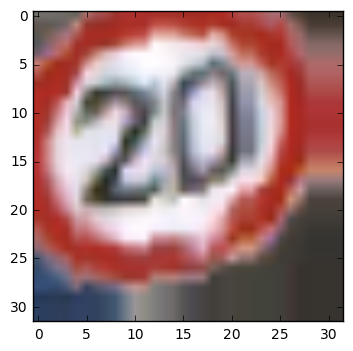

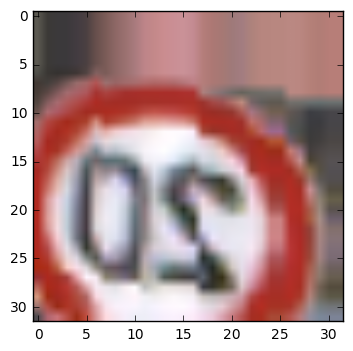

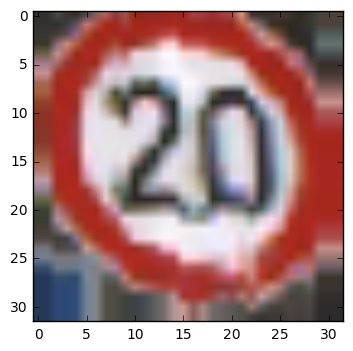

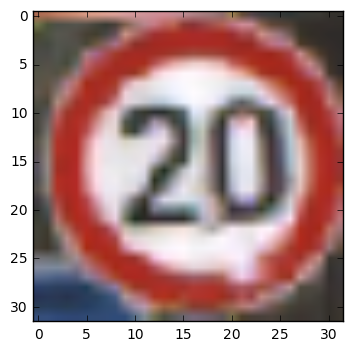

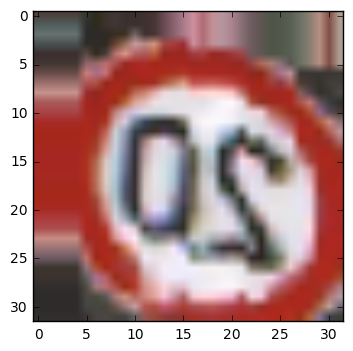

...

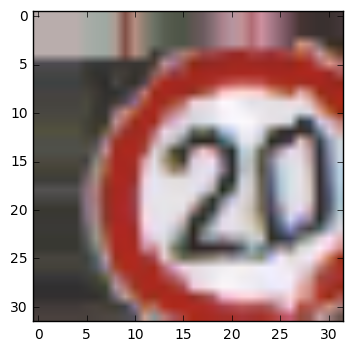

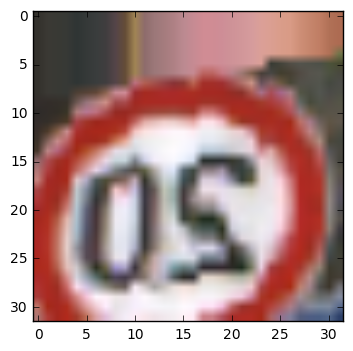

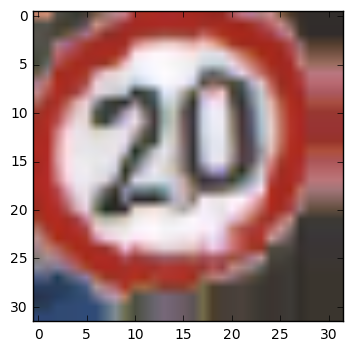

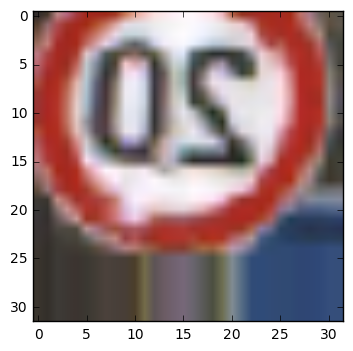

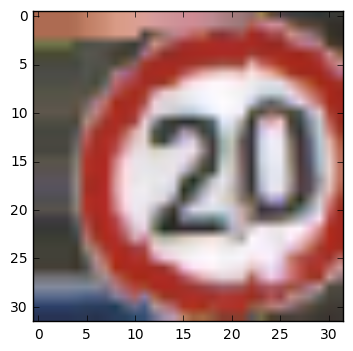

In [284]:

for i in range(400, 450, 1):
    print (labels[i])
    plt.figure(i*i)
    plt.imshow(r_images[i])

/Users/asimranjha/miniconda3/envs/py3/lib/python3.5/site-packages/matplotlib/collections.py:806: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


(array([  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   1.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.,   1.,   1.,   0.,   1.,   0.,   1.,   3.,   3.,
          1.,   1.,   1.,   2.,   2.,   1.,   1.,   2.,   1.,   0.,   3.,
          3.,   1.,   0.,   1.,   0.,   1.,   3.,   3.,   0.,   1.,   5.,
          2.,   0.,   3.,   1.,   4.,   4.,   3.,   1.,   2.,   4.,   3.,
          4.,   7.,   3.,  11.,   6.,   5.,   6.,   7.,   4.,  11.,   4.,
         11.,  11.,  10.,  15.,   9.,  15.,  14.,  14.,  11.,  19.,  14.,
         15.,  10.,  23.,  25.,   9.,  19.,  26.,  29.,  21.,  22.,  32.,
         35.,  33.,  31.,  27.,  34.,  36.,  50.,  42.,  48.,  28.,  44.,
         37.,  39.,  52.,  53.,  41.,  46.,  48.,  52.,  44.,  74.,  51.,
         45.,  39.,  43.,  62.,  61.,  53.,  38.,  48.,  67.,  49.,  38.,
         47.,  56.,  36.,  38.,  52., 

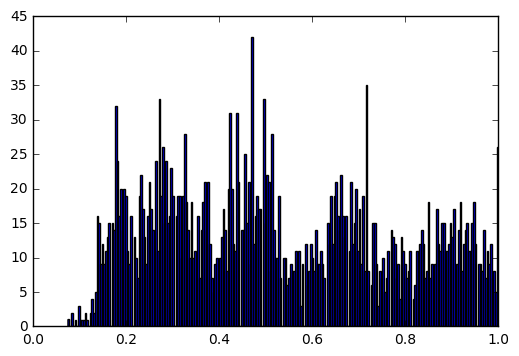

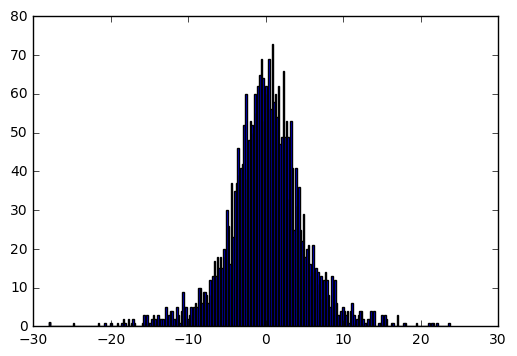

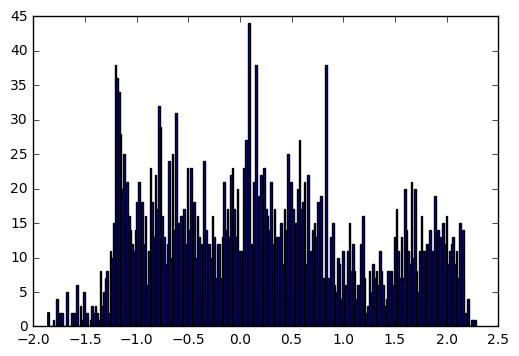

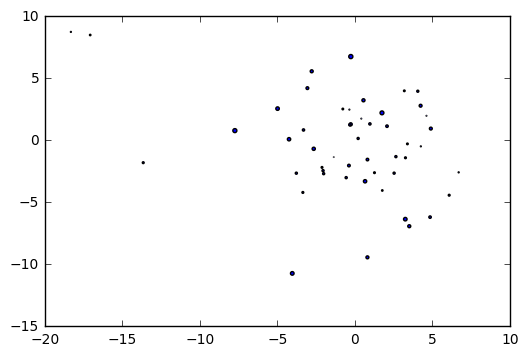

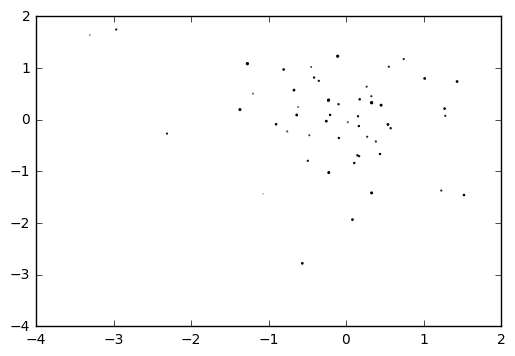

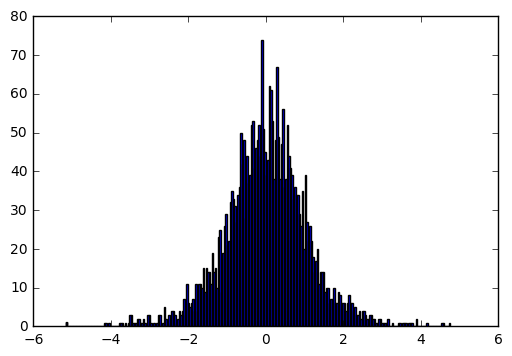

In [244]:
plt.figure(1)
plt.hist(nn_image.flatten(), bins=256)
plt.figure(4)
plt.hist(n_image.flatten(), bins=256)
plt.figure(3)
plt.hist(whitened.flatten(), bins=256)
plt.figure(5)
plt.scatter(whitened[0], whitened[1], whitened[2])
plt.figure(6)
plt.scatter(whitened_unnorm[0], whitened_unnorm[1], whitened_unnorm[2])
plt.figure(7)
plt.hist(whitened_unnorm.flatten(), bins=256)


---
## Step 0: Load The Data

In [8]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = "train.p"
testing_file = "test.p"

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

X_train_coords, X_train_sizes = train['coords'], train['sizes']
X_test_coords, X_test_sizes = test['coords'], test['sizes']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [9]:
### Replace each question mark with the appropriate value.

# TODO: Number of training examples
n_train = X_train.shape[0]

# TODO: Number of testing examples.
n_test = X_test.shape[0]

# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# TODO: How many unique classes/labels there are in the dataset.
n_classes = y_train.shape

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)
print (X_train.shape)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = (39209,)
(39209, 32, 32, 3)


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

/Users/asimranjha/miniconda3/envs/py3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


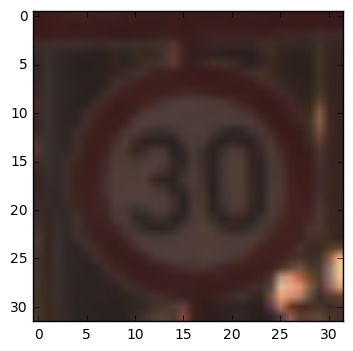

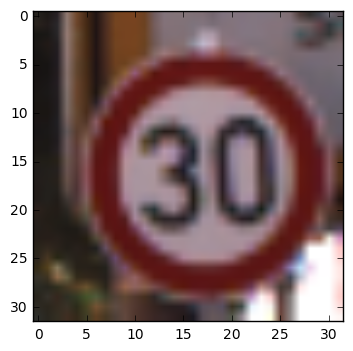

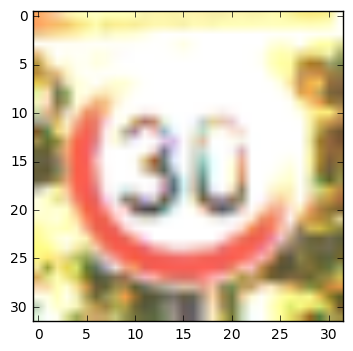

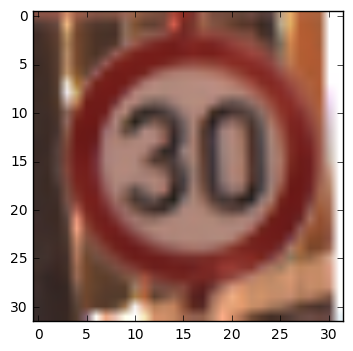

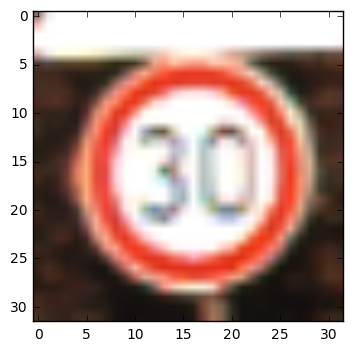

...

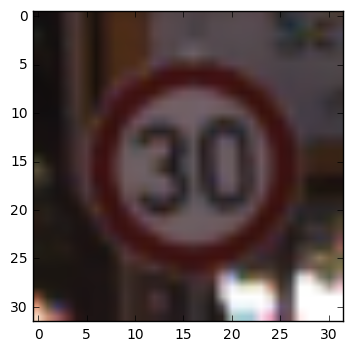

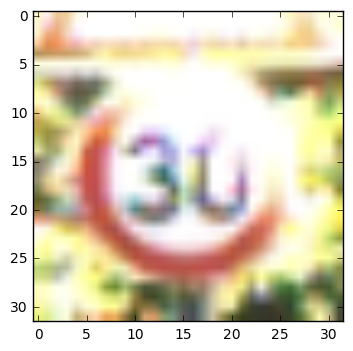

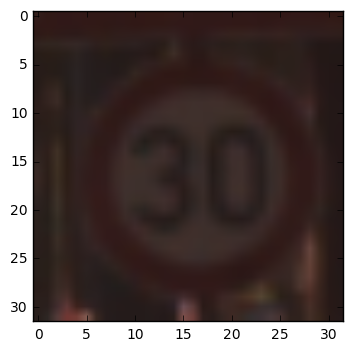

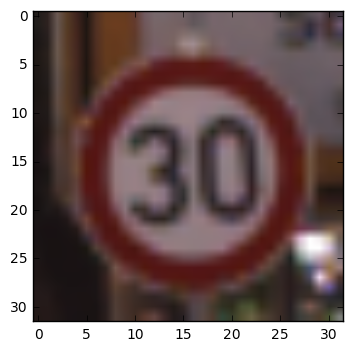

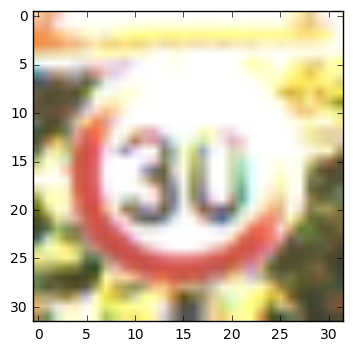

In [10]:
n = 206
for i in range(200, 400, 5):
    plt.figure(i)
    plt.imshow(X_train[i])
    #print (y_train[i])


----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [ ]:
### Preprocess the data here.
### Feel free to use as many code cells as needed.
### One-hot encode the labels

is_labels_encod = False
if not is_labels_encod:
    # Turn labels into numbers and apply One-Hot Encoding
    encoder = LabelBinarizer()
    encoder.fit(y_train)
    y_train = encoder.transform(y_train)
    y_test = encoder.transform(y_test)

    # Change to float32, so it can be multiplied against the features in TensorFlow, which are float32
    y_train = y_train.astype(np.float32)
    y_test = y_test.astype(np.float32)
    is_labels_encod = True

print (y_train[9000])
print('Labels One-Hot Encoded')

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

In [ ]:
### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

datagen = ImageDataGenerator(
    featurewise_center=False,
    featurewise_std_normalization=False,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zca_whitening=True,)



#print (X_train.shape)
# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
#datagen.fit(X_train)

#plt.figure(12)
#plt.imshow(X_train[0])


mean = np.mean(X_train, axis=(0, 1, 2))
broadcast_shape = [1, 1, 1]
broadcast_shape[3 - 1] = X_train.shape[3]
mean = np.reshape(mean, broadcast_shape)

#flatX = np.reshape(X_train, (X_train.shape[0], X_train.shape[1] * X_train.shape[2] * X_train.shape[3]))
#sigma = np.dot(flatX.T, flatX) / flatX.shape[0]
#U,S,V = linalg.svd(sigma)
#pc = np.dot(np.dot(U, np.diag(1. / np.sqrt(S + 10e-7))), U.T)
#print (broadcast_shape)
#print (mean)
#print (flatX[0])
#print (sigma)
#X_train -= mean

#plt.figure(13)
#plt.imshow(X_train[0])

#print (mean)



In [ ]:
print (sigma)

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

In [ ]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

In [ ]:
### Train your model here.
### Feel free to use as many code cells as needed.

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [ ]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

In [ ]:
### Run the predictions here.
### Feel free to use as many code cells as needed.

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**

In [ ]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.